# 4.2.2-T-cells annotation PBMC

**Inés Sentís**

Date of execution 

In [1]:
Sys.Date()

[1] "2025-01-21"

## Introduction

Keep only T-cells

## Libraries

In [2]:
options(warn = -1, verbose = FALSE)
suppressMessages(suppressWarnings({
library(Seurat)
library(here)
library(glue)
library(tidyverse)
library(ggplot2)
library(cowplot)
library(dplyr)
library(harmony)
library(dittoSeq)
library(scater) 
library(scran)
}))

In [3]:
source(here("utils/bin.R"))
source(here("utils/style.R"))

source(here::here("SCGRES_83_120/misc/paths.R"))

"{annot}/{plt_dir}" %>%
  glue::glue() %>%
  here::here() %>%
  dir.create(path = .,
           showWarnings = FALSE,
           recursive = TRUE)

"{annot}/{robj_dir}" %>%
  glue::glue() %>%
  here::here() %>%
  dir.create(path = .,
           showWarnings = FALSE,
           recursive = TRUE)

set.seed(0)

## Load data

Batch1 contains T1, T2, T3

In [4]:
source(here("SCGRES_83_84/sc_analysis/misc/paths.R"))

T1_obj <- readRDS(here(glue("{annot}/{robj_dir}/4.0-l1_all_T1.rds")))
T1_obj <- subset(x = T1_obj, idents=c('CD4 T-cells','CD8 T-cells','T-cells'))

T2_obj <- readRDS(here(glue("{annot}/{robj_dir}/4.0-l1_all_T2.rds")))
T2_obj <- subset(x = T2_obj, idents=c('CD4 T-cells','CD8 T-cells','Proliferative cells'))

T3_obj <- readRDS(here(glue("{annot}/{robj_dir}/4.0-l1_all_T3.rds")))
T3_obj <- subset(x = T3_obj, idents=c('T-cells','Proliferative cells'))

Batch2 contains T5

In [5]:
source(here("SCGRES_99_100/sc_analysis/misc/paths.R"))
T5_obj <- readRDS(here(glue("{annot}/{robj_dir}/4.0-l1_all_T5.rds")))
T5_obj <- subset(x = T5_obj, idents=c('T-cells')) 

Batch3 contains T6

In [6]:
source(here("SCGRES_105_106/sc_analysis/misc/paths.R"))
T6_obj <- readRDS(here(glue("{annot}/{robj_dir}/4.0-l1_all_T6.rds")))
T6_obj <- subset(x = T6_obj, idents=c('T-cells')) 

Batch4 contains T4 and T7

In [7]:
source(here("SCGRES_119_120/sc_analysis/misc/paths.R"))
T4_obj <- readRDS(here(glue("{annot}/{robj_dir}/4.0-l1_all_T4.rds")))
T4_obj <- subset(x = T4_obj, idents=c("CD8 T-cells", "CD4 T-cells")) 

T7_obj <- readRDS(here(glue("{annot}/{robj_dir}/4.0-l1_all_T7.rds")))
T7_obj <- subset(x = T7_obj, idents=c("CD8 T-cells", "CD4 T-cells")) 

In [8]:
list_objects <- list("T1"=T1_obj,
                     "T2"=T2_obj,
                     "T3"=T3_obj,
                     "T4"=T4_obj,
                     "T5"=T5_obj,
                     "T6"=T6_obj,
                     "T7"=T7_obj)
naming = names(list_objects)

In [9]:
list_objects <- lapply(list_objects, function(obj) {

    obj <- DietSeurat(
      obj,
      counts = TRUE,
      data = TRUE,
      scale.data = FALSE,
      features = NULL,
      assays = NULL,
      dimreducs = FALSE,
      graphs = NULL
    )
    keep_genes <- data.frame(rowSums(as.matrix(obj[['RNA']]@counts)) != 0)
    colnames(keep_genes) <- "logical"
    keep_genes <- subset(keep_genes, logical==TRUE)
    obj[['RNA']]@counts <- obj[['RNA']]@counts[rownames(keep_genes), ]
    obj[['RNA']]@data <- obj[['RNA']]@data[rownames(keep_genes), ]
    
    obj
})

list_objects <- setNames(list_objects, naming)

In [10]:
seurat_obj <- merge(
  x = list_objects[[1]],
  y = list_objects[2:length(list_objects)])

### Get intersection of variable features across timepoints

In [11]:
list_hvg <- lapply(list_objects, function(obj) {
    list_samples <- SplitObject(obj, split.by = "sample_id")
    in_list_hvg  <- lapply(list_samples, function(sam) {
        sam <- sam %>% 
            NormalizeData(
                normalization.method = "LogNormalize",
                scale.factor = 1e4) 

        sce <- as.SingleCellExperiment(sam)
        gene_var <- modelGeneVar(sce)
        hvgs <- getTopHVGs(gene_var,fdr.threshold = 0.05)
        hvgs <- hvgs[!grepl("^TR[AB][VJC]", hvgs)]
        hvgs
        }) 
    return(in_list_hvg)
})

In [12]:
list_hvg <- c(list_hvg[[1]], list_hvg[[2]], list_hvg[[3]], list_hvg[[5]])
length(list_hvg)

[1] 7

In [13]:
hvg_common <- find_perc(list_hvg,perc = 0.25)
length(hvg_common)                       

[1] 835

In [14]:
VariableFeatures(seurat_obj) <- hvg_common

In [15]:
# save memory
remove(list_objects)

## Normalization and Embedding

In [16]:
seurat_obj <- NormalizeData(
seurat_obj,
  normalization.method = "LogNormalize",
  scale.factor = 1e4
)
seurat_obj <- seurat_obj %>%
  ScaleData(features=hvg_common) %>% 
  RunPCA(features=hvg_common)

Centering and scaling data matrix

PC_ 1 
Positive:  NKG7, HLA-DRB1, HLA-DRA, CD74, HIST1H1B, CCL5, ZEB2, RRM2, GZMA, PRF1 
	   HLA-DPA1, CST7, GAPDH, MKI67, HMGB2, STMN1, HIST1H2AL, HIST1H3C, HIST1H3B, HIST1H1E 
	   HIST1H2AH, TUBA1B, HIST1H1C, LGALS1, PLEK, GZMB, GZMH, GNLY, HIST1H1D, ACTB 
Negative:  LTB, IL7R, BCL2, IFITM1, TXNIP, FAM13A, CISH, BACH2, SLC2A3, FHIT 
	   SELL, CD69, TSC22D3, JUNB, AQP3, FOS, NELL2, ZNF331, PTGER2, HBB 
	   JUN, AL589693.1, RPS2, TTN, TNFAIP3, IL2RA, ZNF462, EDA, PPP1R15A, CXCR4 
PC_ 2 
Positive:  CST7, GZMH, CCL5, NKG7, FGFBP2, PRF1, ADGRG1, CTSW, KLRK1, HCST 
	   CCL4, FCRL6, GZMA, CD8A, GZMB, SPON2, KLRD1, CX3CR1, CD8B, CD52 
	   KLRC4, MCTP2, FCGR3A, GNLY, ZNF683, PLEK, IL32, HOPX, PPP2R2B, AC243829.2 
Negative:  S100A9, HIST1H1B, HIST1H2AL, HIST1H3C, LYZ, S100A8, HIST1H2AI, CST3, IFI30, HIST1H2AH 
	   HIST1H3B, FCN1, HIST1H4F, VCAN, TYROBP, FTH1, RRM2, FCER1G, HIST1H2BF, VIM 
	   HIST1H1E, IL1B, HIST1H1D, HIST1H1C, SLC8A1, PLXDC2, HIST1H4C, TUBA1

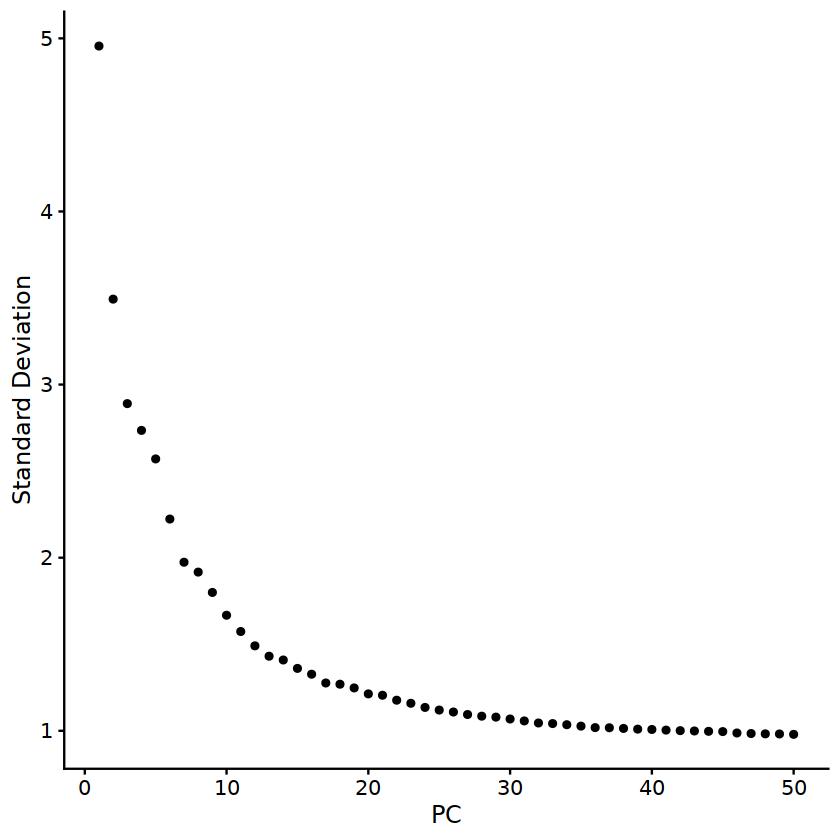

In [17]:
ElbowPlot(seurat_obj, n=50)

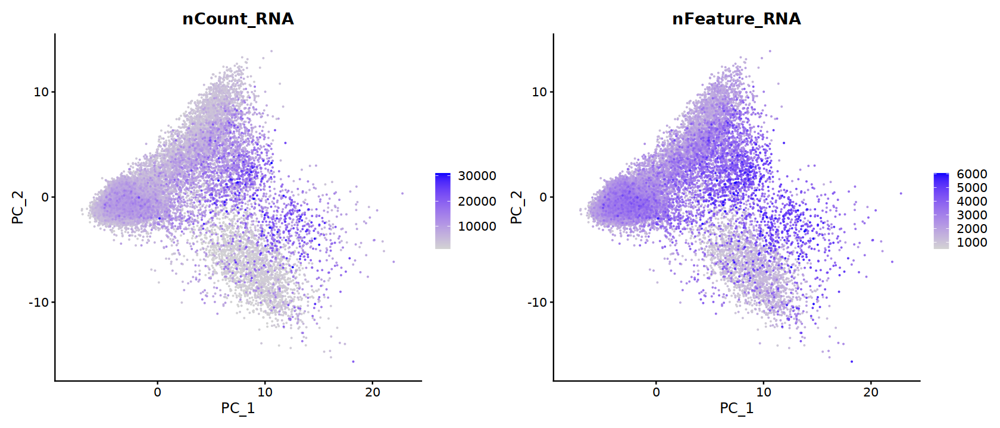

In [18]:
options(repr.plot.width = 14, repr.plot.height = 6)
FeaturePlot(object = seurat_obj, reduction = "pca",
    features = c("nCount_RNA", "nFeature_RNA"), order = T)

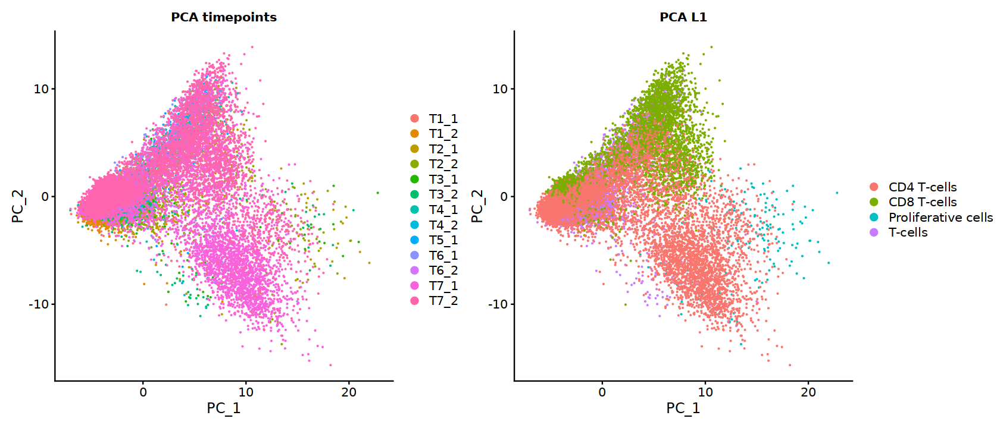

In [19]:
options(repr.plot.width = 14, repr.plot.height = 6, warn=-1,verbose = FALSE)
dp1 <- DimPlot(
  seurat_obj,
  reduction = "pca",
  group.by = "sample_id",
  pt.size = 0.1
) + ggtitle('PCA timepoints') + 
    theme(plot.title = element_text(hjust = 0.5, size = 12, face = "bold"))
dp2 <- DimPlot(
  seurat_obj,
  reduction = "pca",
  group.by = "l1_annot",
  pt.size = 0.1
) + ggtitle('PCA L1') + 
    theme(plot.title = element_text(hjust = 0.5, size = 12, face = "bold"))
dp1 + dp2

In [20]:
comp=25

In [21]:
seurat_obj <- RunUMAP(
  seurat_obj,
  dims = 1:comp,
  reduction = "pca",
  reduction.name = "umap",
  reduction.key = "UMAP_"
)

10:35:42 UMAP embedding parameters a = 0.9922 b = 1.112

10:35:42 Read 24883 rows and found 25 numeric columns

10:35:42 Using Annoy for neighbor search, n_neighbors = 30

10:35:42 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:35:44 Writing NN index file to temp file /scratch_tmp/34329397/RtmpJjA6IZ/file2992c2184bc12

10:35:44 Searching Annoy index using 1 thread, search_k = 3000

10:35:52 Annoy recall = 100%

10:35:53 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

10:35:54 Initializing from normalized Laplacian + noise (using irlba)

10:35:55 Commencing optimization for 200 epochs, with 1088288 positive edges

10:36:22 Optimization finished



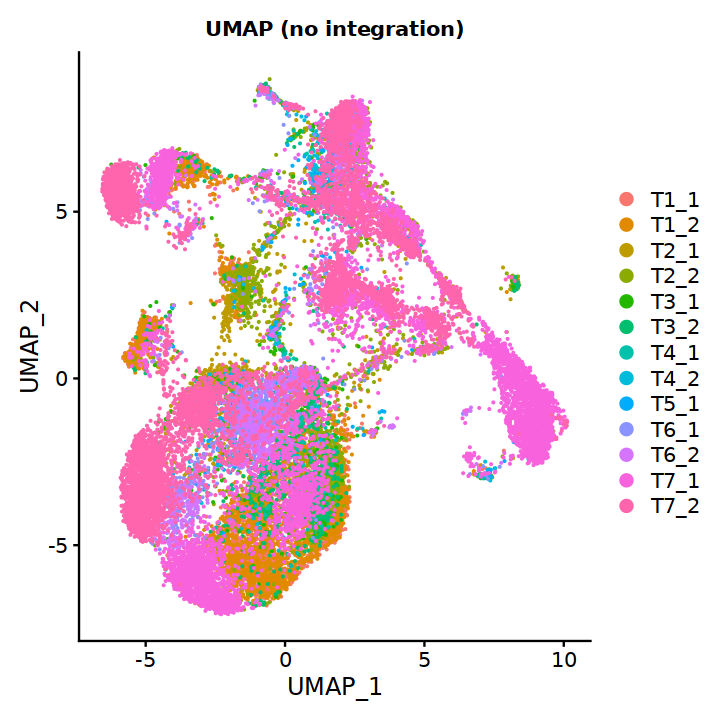

In [22]:
options(repr.plot.width = 6, repr.plot.height = 6, warn=-1,verbose = FALSE)
DimPlot(
  seurat_obj,
  reduction = "umap",
  group.by = "sample_id",
  pt.size = 0.1
) + ggtitle('UMAP (no integration)') + 
     theme(plot.title = element_text(hjust = 0.5, size = 12, face = "bold"))

### Integration with Harmony

In [23]:
# make a copy of the PCA reduction
seurat_obj@reductions$pca_filt <- seurat_obj@reductions$pca

# Filter to the desired number of components according to elbow
seurat_obj@reductions$pca_filt@cell.embeddings <- seurat_obj@reductions$pca_filt@cell.embeddings[, c(1:comp)]
seurat_obj@reductions$pca_filt@feature.loadings <- seurat_obj@reductions$pca_filt@feature.loadings[, c(1:comp)]

In [24]:
seurat_obj <- RunHarmony(
  object = seurat_obj,
  reduction = "pca_filt",
  group.by.vars = "sample_id",
  assay.use = "RNA",
  project.dim = FALSE,
  reduction.save = "harmony"
)

Transposing data matrix

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony converged after 4 iterations



In [25]:
seurat_obj <- RunUMAP(
  seurat_obj,
  dims = 1:comp,
  reduction = "harmony",
  reduction.name = "umap",
  reduction.key = "UMAP_"
)

10:36:49 UMAP embedding parameters a = 0.9922 b = 1.112

10:36:50 Read 24883 rows and found 25 numeric columns

10:36:50 Using Annoy for neighbor search, n_neighbors = 30

10:36:50 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:36:52 Writing NN index file to temp file /scratch_tmp/34329397/RtmpJjA6IZ/file2992c3171ea45

10:36:52 Searching Annoy index using 1 thread, search_k = 3000

10:37:00 Annoy recall = 100%

10:37:01 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

10:37:02 Initializing from normalized Laplacian + noise (using irlba)

10:37:03 Commencing optimization for 200 epochs, with 1108116 positive edges

10:37:31 Optimization finished



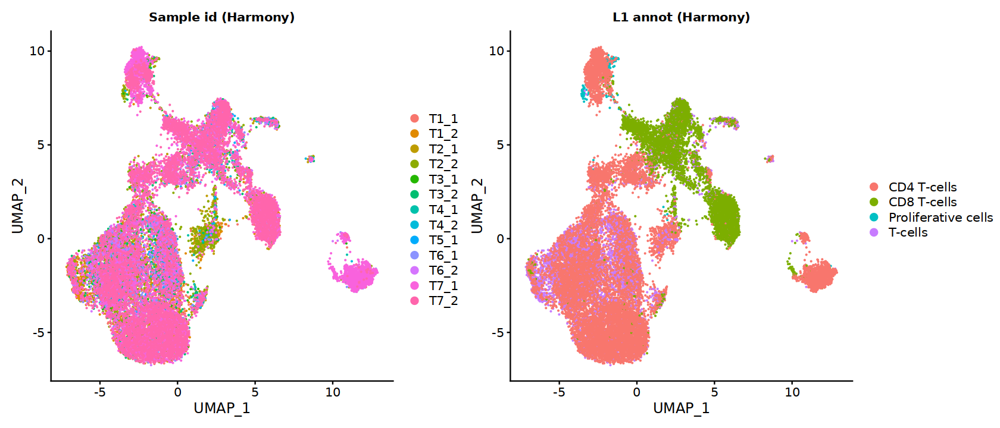

In [26]:
options(repr.plot.width = 14, repr.plot.height = 6, warn=-1,verbose = FALSE)
dpt <- DimPlot(
  seurat_obj,
  reduction = "umap",
  group.by = "sample_id",
  pt.size = 0.1
) + ggtitle('Sample id (Harmony)') + 
     theme(plot.title = element_text(hjust = 0.5, size = 12, face = "bold"))
dpl2 <- DimPlot(
  seurat_obj,
  reduction = "umap",
  group.by = "l1_annot",
  pt.size = 0.1
) + ggtitle('L1 annot (Harmony)') + 
     theme(plot.title = element_text(hjust = 0.5, size = 12, face = "bold"))

dpt + dpl2

## Clustering

In [27]:
# Find the K-nearest neighbors
seurat_obj <- FindNeighbors(seurat_obj, reduction = "harmony", dims = 1:comp)
# Find clusters at different resolutions
clusters_df <- cluster_diff_resolutions(
  seurat_obj = seurat_obj,
  min_resolution = 0.1,
  max_resolution = 1.0,
  step = 0.05
)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 24883
Number of edges: 892479

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9589
Number of communities: 10
Elapsed time: 5 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 24883
Number of edges: 892479

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9497
Number of communities: 11
Elapsed time: 5 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 24883
Number of edges: 892479

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9432
Number of communities: 13
Elapsed time: 5 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 24883
Number of edges: 892479

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9368
Number of communities: 13
Elapsed time: 6 seconds
Modularity O

In [28]:
list_plots <- lapply(unique(clusters_df$resolution), function(x) {
  p <- add_reso_results(seurat_obj, clusters_df, resolution=x)
  umap <- DimPlot(p, reduction = "umap", 
                  group.by=glue::glue("seurat_clusters")) +
    labs(title=glue::glue("Resolution {x}"))
  return(umap)
})

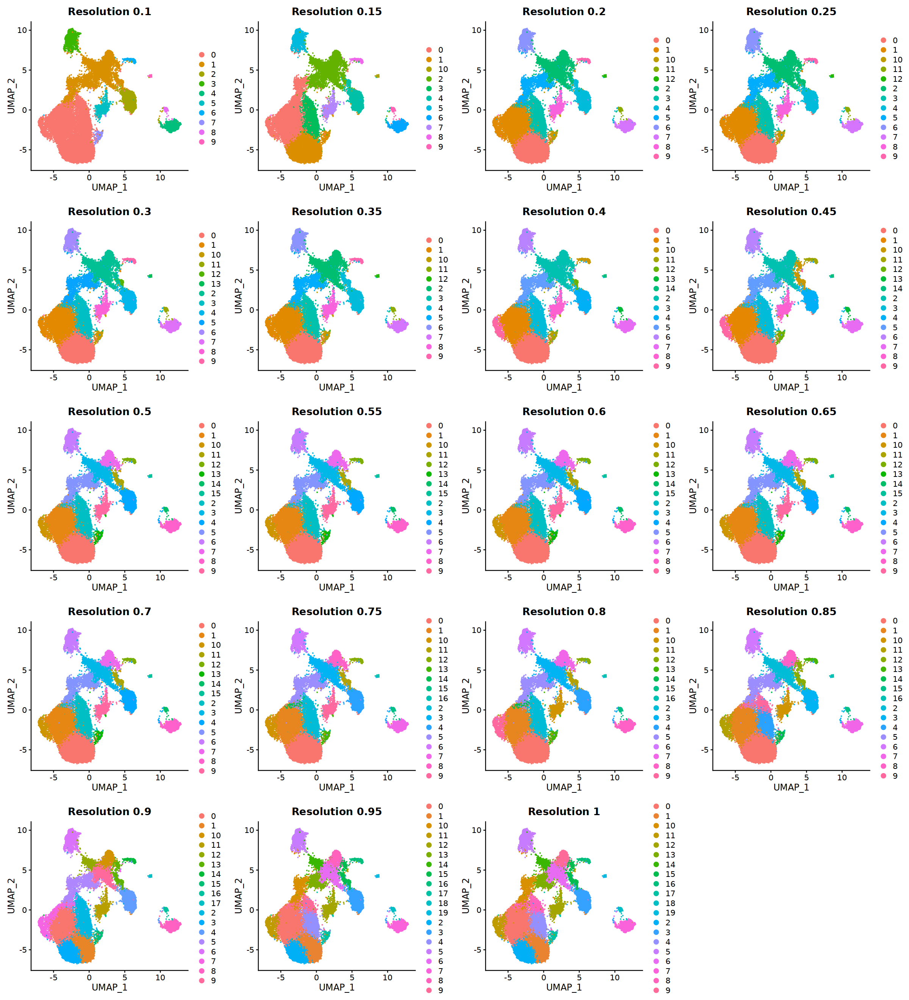

In [29]:
options(repr.plot.width = 20, repr.plot.height = 22, warn=-1,verbose = FALSE)
cp <- cowplot::plot_grid(plotlist = list_plots,
                   align = "hv",
                   axis = "trbl",
                   ncol=4,
                   nrow=5)
cp

Some NKs within the proliferative cells

In [30]:
tcell_markers = c("CD3E","CD3D", "CD4", "CD8A","CD8B","MKI67", "TOP2A",
                  "ANXA1","NKG7","KLRD1","NCAM1","GNLY","PRF1","ICOS",
                  "FOXP3","CXCR3", "GATA3","RORA","SELL", "LEF1", "FCGR3A",
                  "TRDC", "TRGC1","TRGC2", "KIT", "CD34","ZNF683", 
                  "CX3CR1", "ITGAE")

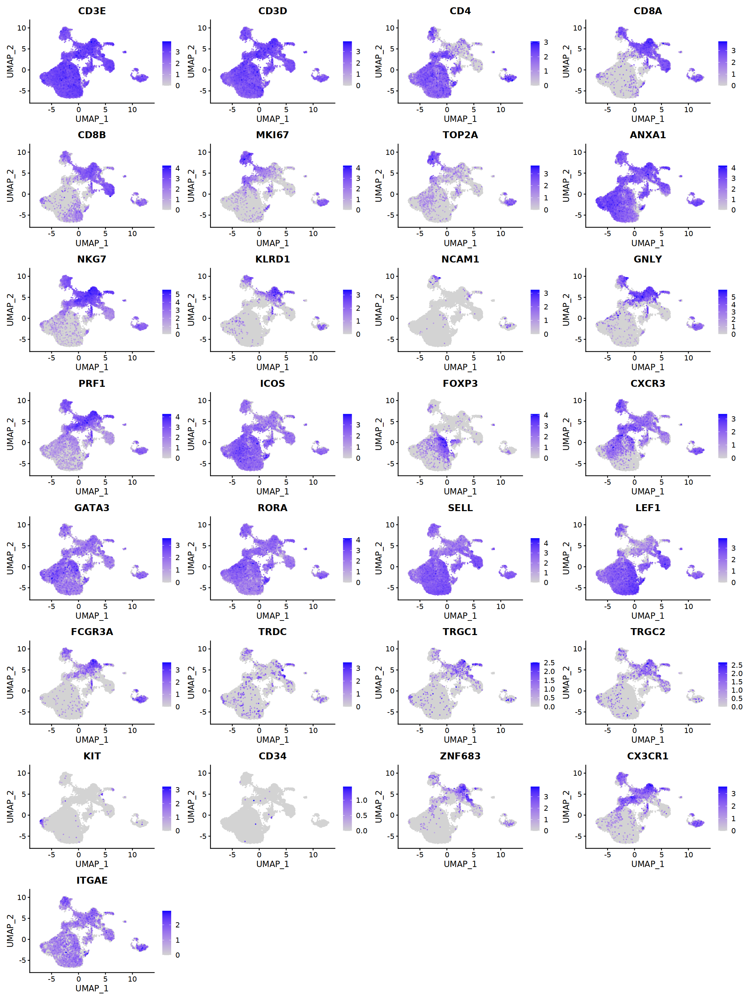

In [31]:
options(repr.plot.width = 18, repr.plot.height = 24, warn=-1,verbose = FALSE)
FeaturePlot(seurat_obj, reduction = "umap", 
            feature=tcell_markers, 
            order = TRUE, ncol=4)

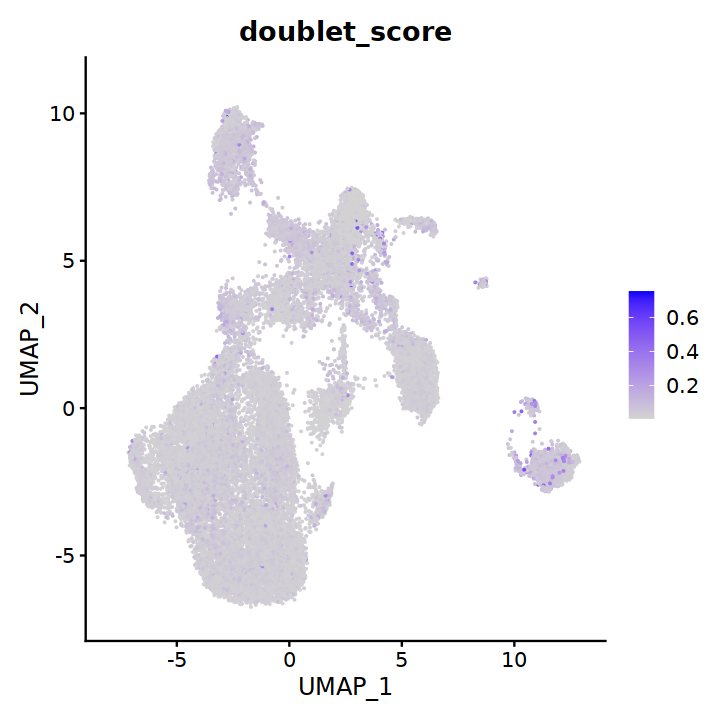

In [32]:
options(repr.plot.width = 6, repr.plot.height = 6, warn=-1,verbose = FALSE)
FeaturePlot(seurat_obj, reduction = "umap", 
            feature="doublet_score", 
            order = FALSE)

### Resolution chosen

In [33]:
reso=0.8

In [34]:
seurat_obj <- FindClusters(seurat_obj, resolution = reso)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 24883
Number of edges: 892479

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8772
Number of communities: 17
Elapsed time: 4 seconds


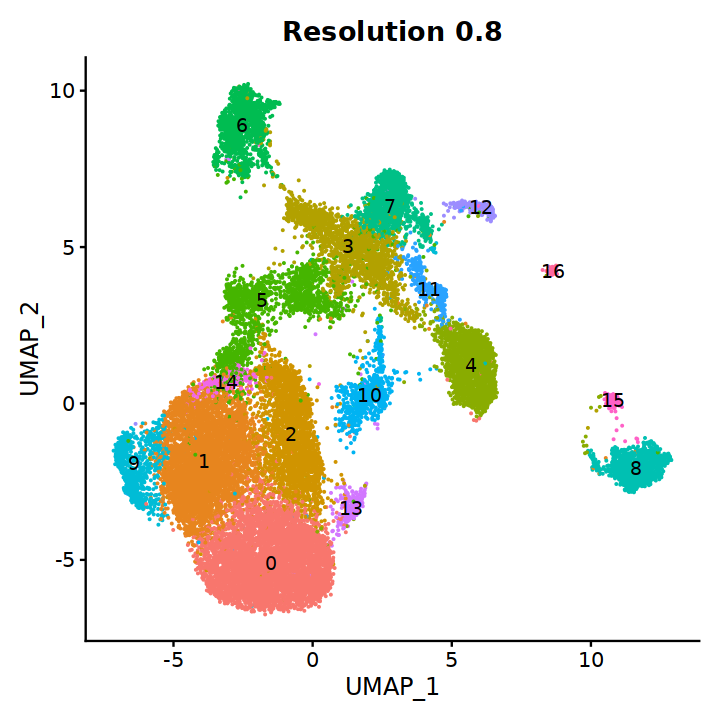

In [35]:
options(repr.plot.width = 6, repr.plot.height = 6, warn=-1,verbose = FALSE)
DimPlot(seurat_obj, reduction = "umap", label = T)+ NoLegend() +
  labs(title=glue("Resolution {reso}")) + theme(plot.title = element_text(hjust = 0.5))

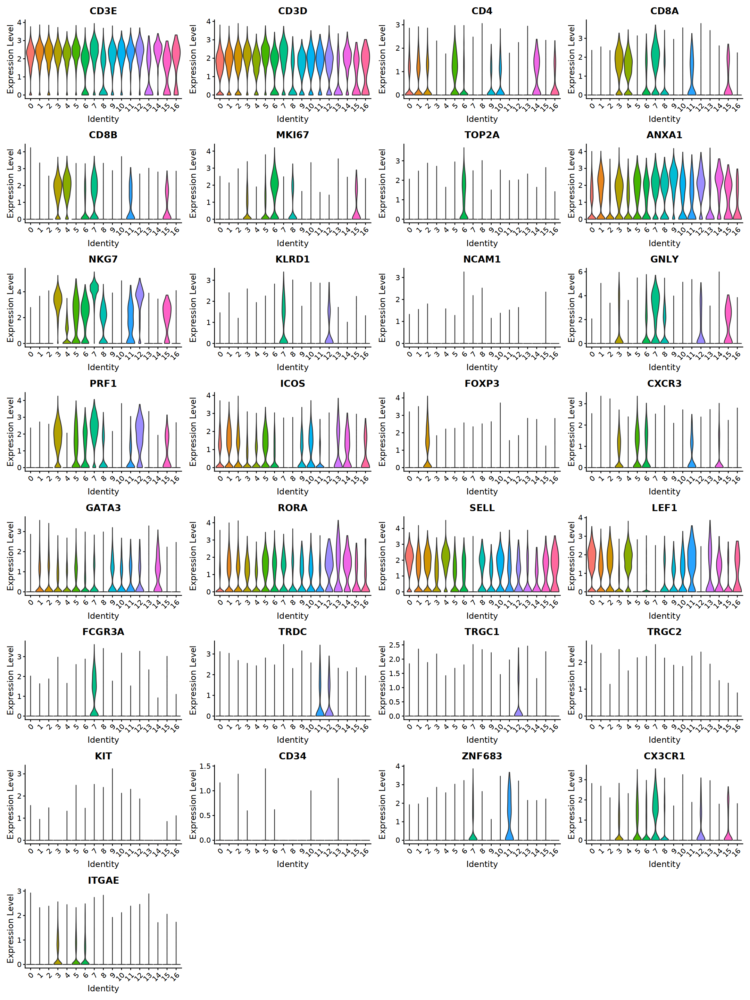

In [36]:
options(repr.plot.width = 18, repr.plot.height = 24, warn=-1,verbose = FALSE)
VlnPlot(seurat_obj,feature=tcell_markers, pt.size = 0,
            ncol=4)

In [37]:
seurat_obj <- FindSubCluster(
  seurat_obj,
  cluster="6",
  graph.name = "RNA_snn",
  subcluster.name = "subclustering",
  resolution = 0.2,
  algorithm = 1
)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1400
Number of edges: 53729

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8275
Number of communities: 4
Elapsed time: 0 seconds


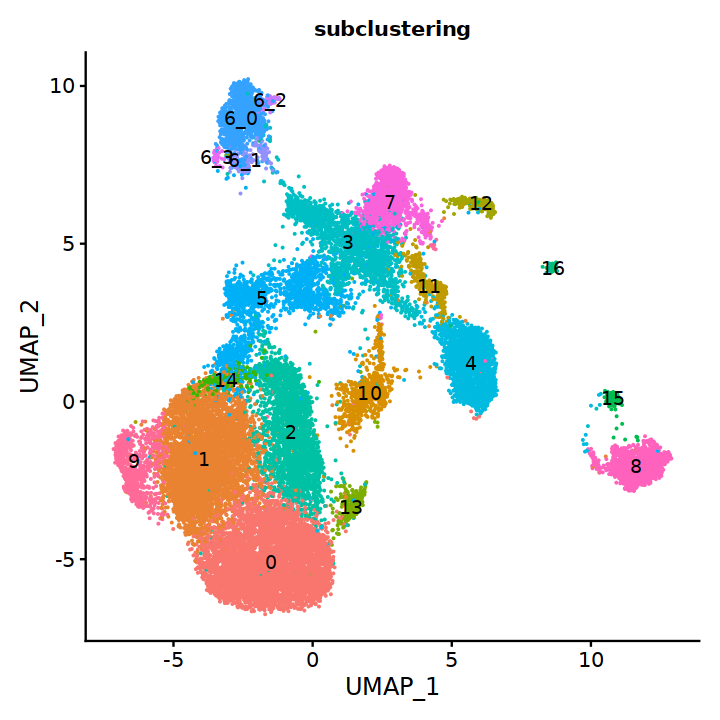

In [38]:
options(repr.plot.width = 6, repr.plot.height = 6, warn=-1,verbose = FALSE)
DimPlot(seurat_obj, reduction = "umap", label = T, group.by="subclustering")+ NoLegend() +
  labs(title=glue("subclustering")) + 
  theme(plot.title = element_text(hjust = 0.5, size = 12, face = "bold"))

In [39]:
seurat_obj <- SetIdent(seurat_obj, value=seurat_obj@meta.data$subclustering)

In [40]:
rna.markers <- FindAllMarkers(seurat_obj, min.pct=0.1, logfc.threshold=0.1, 
                              random.seed=0, max.cells.per.ident=2000, 
                              only.pos=TRUE)

Calculating cluster 5

Calculating cluster 14

Calculating cluster 0

Calculating cluster 2

Calculating cluster 10

Calculating cluster 4

Calculating cluster 1

Calculating cluster 9

Calculating cluster 12

Calculating cluster 11

Calculating cluster 13

Calculating cluster 8

Calculating cluster 16

Calculating cluster 3

Calculating cluster 6_0

Calculating cluster 15

Calculating cluster 7

Calculating cluster 6_3

Calculating cluster 6_2

Calculating cluster 6_1



In [41]:
rna.markers <- rna.markers %>% 
  dplyr::filter(p_val_adj < 0.05) %>% 
  arrange(desc(avg_log2FC))

In [42]:
source(here("SCGRES_83_120/misc/paths.R"))
write.csv(rna.markers, here(glue("{annot}/{robj_dir}/4.2.2-first_clustering_subset_tcell.csv")), row.names=TRUE)

In [43]:
c <- 16

rna.markers %>% 
  dplyr::filter(cluster == c) %>% 
  dplyr::filter(p_val_adj < 0.05) %>% 
  arrange(desc(avg_log2FC)) %>% head(n=40)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
HBB,6.159549e-92,8.1296487,1.000,0.267,1.738409e-87,16,HBB
HBA2,7.279274e-260,3.4215150,0.745,0.013,2.054429e-255,16,HBA2
ALAS2,8.722524e-178,3.0197445,0.491,0.008,2.461758e-173,16,ALAS2
HBA1,2.306265e-236,2.9557440,0.689,0.010,6.508972e-232,16,HBA1
HBD,4.960282e-89,2.5645461,0.274,0.006,1.399940e-84,16,HBD
IFI27,1.971815e-37,2.0356870,0.358,0.047,5.565053e-33,16,IFI27
CA1,5.117277e-83,2.0320887,0.226,0.004,1.444249e-78,16,CA1
SLC25A37,7.519109e-45,1.8197880,0.415,0.063,2.122118e-40,16,SLC25A37
AHSP,4.805471e-83,1.7158987,0.226,0.003,1.356248e-78,16,AHSP


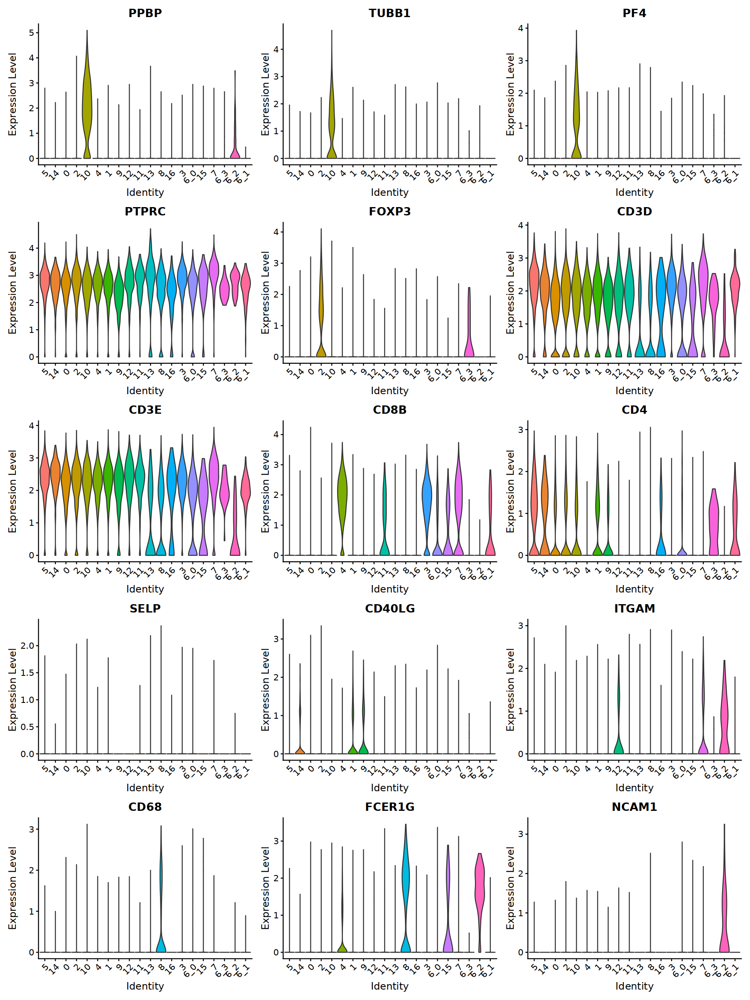

In [44]:
options(repr.plot.width = 15, repr.plot.height = 20, warn=-1,verbose = FALSE)
VlnPlot(seurat_obj,
            feature=c("PPBP", "TUBB1", "PF4", "PTPRC","FOXP3",
                      "CD3D","CD3E","CD8B","CD4", "SELP", "CD40LG", 
                      "ITGAM", "CD68", "FCER1G", "NCAM1"), ncol=3,
       pt.size = 0)

Low quality cells/doublets

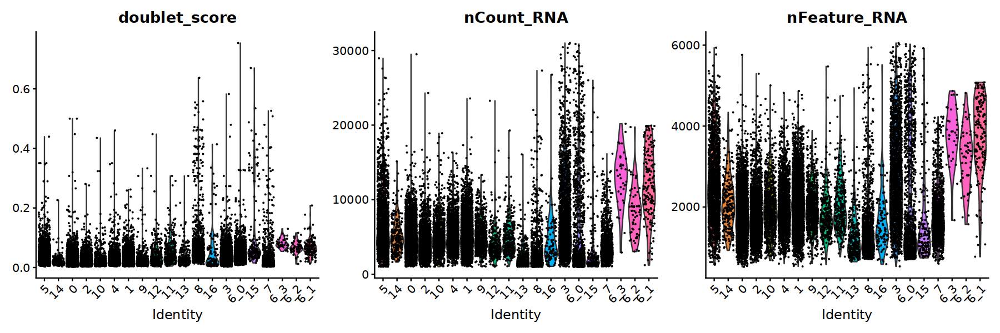

In [45]:
options(repr.plot.width = 15, repr.plot.height = 5, warn=-1,verbose = FALSE)
VlnPlot(seurat_obj,feature=c("doublet_score", "nCount_RNA", "nFeature_RNA"), 
            ncol=3)

In [46]:
num_c=8
rna.markers %>% filter(cluster == num_c) %>% 
  arrange(desc(avg_log2FC)) %>% head

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
S100A9,0,4.261436,0.912,0.099,0,8,S100A9
S100A8,0,3.724116,0.812,0.064,0,8,S100A8
LYZ,0,3.602596,0.893,0.089,0,8,LYZ
IFI30,0,3.018399,0.793,0.096,0,8,IFI30
TYROBP1,0,2.927255,0.780,0.058,0,8,TYROBP
CST3,0,2.722579,0.711,0.050,0,8,CST3


In [47]:
num_c=10
rna.markers %>% filter(cluster == num_c) %>% 
  arrange(desc(avg_log2FC)) %>% head

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
PPBP,0.000000e+00,3.460059,0.843,0.046,0.000000e+00,10,PPBP
TUBB1,0.000000e+00,2.272133,0.641,0.015,0.000000e+00,10,TUBB1
PF4,1.635617e-301,2.214053,0.650,0.023,4.616201e-297,10,PF4
GNG11,6.944311e-264,1.829349,0.556,0.013,1.959893e-259,10,GNG11
CAVIN2,2.699620e-273,1.823319,0.568,0.014,7.619137e-269,10,CAVIN2
NRGN,7.079678e-256,1.678496,0.555,0.020,1.998098e-251,10,NRGN


In [48]:
num_c=13
rna.markers %>% filter(cluster == num_c) %>% 
  arrange(desc(avg_log2FC)) %>% head

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
PTPRJ1,5.193118e-37,2.000408,0.555,0.296,1.465654e-32,13,PTPRJ
CHST112,1.191097e-34,1.828708,0.635,0.435,3.361634e-30,13,CHST11
ANKRD111,1.765641e-37,1.803516,0.672,0.503,4.983169e-33,13,ANKRD11
MTRNR2L122,1.518975e-62,1.780139,0.980,0.946,4.287003e-58,13,MTRNR2L12
PHACTR26,1.437796e-24,1.745226,0.555,0.378,4.057891e-20,13,PHACTR2
ATXN12,3.118014e-41,1.732956,0.699,0.490,8.799972e-37,13,ATXN1


In [49]:
num_c=15
rna.markers %>% filter(cluster == num_c) %>% 
  arrange(desc(avg_log2FC)) %>% head

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
HLA-DRA4,2.311649e-94,2.573963,0.896,0.268,6.524167e-90,15,HLA-DRA
CD79A6,1.543165e-152,2.494973,0.695,0.066,4.355275e-148,15,CD79A
IGHM3,8.847486e-120,2.324402,0.500,0.039,2.497026e-115,15,IGHM
CD745,3.190319e-82,2.260739,1.000,0.879,9.004036e-78,15,CD74
MS4A13,2.500671e-171,2.212891,0.524,0.021,7.057642e-167,15,MS4A1
BANK13,3.932801e-140,2.152377,0.518,0.027,1.109954e-135,15,BANK1


In [50]:
num_c=16
rna.markers %>% filter(cluster == num_c) %>% 
  arrange(desc(avg_log2FC)) %>% head

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
HBB,6.159549e-92,8.129649,1.000,0.267,1.738409e-87,16,HBB
HBA2,7.279274e-260,3.421515,0.745,0.013,2.054429e-255,16,HBA2
ALAS2,8.722524e-178,3.019744,0.491,0.008,2.461758e-173,16,ALAS2
HBA1,2.306265e-236,2.955744,0.689,0.010,6.508972e-232,16,HBA1
HBD,4.960282e-89,2.564546,0.274,0.006,1.399940e-84,16,HBD
IFI27,1.971815e-37,2.035687,0.358,0.047,5.565053e-33,16,IFI27


In [51]:
num_c="6_2"
rna.markers %>% filter(cluster == num_c) %>% 
  arrange(desc(avg_log2FC)) %>% head

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
HIST1H4C4,7.717463e-39,4.007049,1.000,0.534,2.178100e-34,6_2,HIST1H4C
GNLY6,1.505521e-68,3.951494,0.965,0.136,4.249032e-64,6_2,GNLY
HIST1H3B4,1.314892e-94,3.527541,1.000,0.113,3.711020e-90,6_2,HIST1H3B
HIST1H1B4,9.267978e-78,3.371888,1.000,0.149,2.615702e-73,6_2,HIST1H1B
MKI676,7.070591e-85,3.160338,0.982,0.132,1.995533e-80,6_2,MKI67
STMN16,2.168697e-50,3.037132,0.982,0.270,6.120714e-46,6_2,STMN1


## Re-processing

In [52]:
# remove clusters
seurat_obj = subset(x = seurat_obj, idents = c('6_2','8',"10", '13', '15', '16'), 
                    invert=T)

# lighten the object
seurat_obj <- DietSeurat(
  seurat_obj,
  counts = TRUE,
  data = TRUE,
  scale.data = FALSE,
  features = NULL,
  assays = NULL,
  dimreducs = FALSE,
  graphs = NULL
)

# remove genes with 0 counts
print(table(rowSums(as.matrix(seurat_obj[['RNA']]@counts)) == 0))
  
keep_genes <- data.frame(rowSums(as.matrix(seurat_obj[['RNA']]@counts)) != 0)
colnames(keep_genes) <- "logical"
keep_genes <- subset(keep_genes, logical==TRUE)
seurat_obj[['RNA']]@data <- seurat_obj[['RNA']]@data[rownames(keep_genes), ]
seurat_obj[['RNA']]@counts <- seurat_obj[['RNA']]@counts[rownames(keep_genes), ]


FALSE  TRUE 
27787   436 


Find variable genes again

In [53]:
list_objects = SplitObject(seurat_obj, split.by = "sample_id")

In [54]:
list_hvg <- lapply(list_objects, function(obj) {
    list_samples <- SplitObject(obj, split.by = "sample_id")
    in_list_hvg  <- lapply(list_samples, function(sam) {
        sam <- sam %>% 
            NormalizeData(
                normalization.method = "LogNormalize",
                scale.factor = 1e4) 

        sce <- as.SingleCellExperiment(sam)
        gene_var <- modelGeneVar(sce)
        hvgs <- getTopHVGs(gene_var,fdr.threshold = 0.05)
        hvgs <- hvgs[!grepl("^TR[AB][VJC]", hvgs)]
        hvgs
        }) 
    return(in_list_hvg)
})

In [55]:
list_hvg <- c(list_hvg[[1]], list_hvg[[2]], list_hvg[[3]], 
              list_hvg[[4]], list_hvg[[5]])
length(list_hvg)

[1] 5

In [56]:
hvg_common <- find_perc(list_hvg,perc = 0.25)
length(hvg_common)                       

[1] 391

In [57]:
VariableFeatures(seurat_obj) <- hvg_common

In [58]:
# save memory
remove(list_objects)

Normalize and compute PCA

In [59]:
seurat_obj <- NormalizeData(
seurat_obj,
  normalization.method = "LogNormalize",
  scale.factor = 1e4
)
seurat_obj <- seurat_obj %>%
  ScaleData(features=hvg_common) %>% 
  RunPCA(features=hvg_common)

Centering and scaling data matrix

PC_ 1 
Positive:  LTB, IL7R, MALAT1, RPS19, RPL13, FAM13A, IFITM1, TXNIP, SELL, FHIT 
	   RPL3, FOS, JUNB, SLC2A3, TSC22D3, CD69, NELL2, JUN, AQP3, AL589693.1 
	   RPLP0, FTH1, PPP1R15A, EDA, KLF6, IL2RA, SOX4, FOSB, TNFAIP3, FTL 
Negative:  NKG7, CCL5, CST7, PRF1, GZMA, ZEB2, HLA-DRB1, GZMH, CD74, HLA-DRA 
	   GAPDH, FGFBP2, GZMB, PLEK, RRM2, MKI67, LGALS1, HMGB2, CX3CR1, GNLY 
	   CCL4, STMN1, SH3BGRL3, GZMK, HIST1H1B, S100A4, SPON2, IL32, ACTB, HIST1H3B 
PC_ 2 
Positive:  HIST1H1B, HIST1H2AH, HIST1H3C, HIST1H2AL, RRM2, HIST1H3B, HIST1H2AI, MKI67, STMN1, HIST1H3G 
	   TUBA1B, HIST1H4C, HIST1H3F, HIST1H2BF, HIST1H1D, HMGB2, CENPF, HIST1H1E, VIM, HMGN2 
	   ACTB, RPLP0, GAPDH, PFN1, ACTG1, S100A10, HLA-DRA, CTLA4, MIR924HG, SELL 
Negative:  GZMH, ADGRG1, CTSW, KLRK1, NKG7, CCL5, FGFBP2, FCGR3A, KLRD1, CST7 
	   GZMB, CD8A, CD8B, AOAH, MALAT1, CCL4, PRF1, GNLY, SPON2, TXNIP 
	   CX3CR1, PLEK, ZNF683, ZEB2, AC243829.2, PPP2R2B, KLRC2, GZMA, IFITM1, CXCR

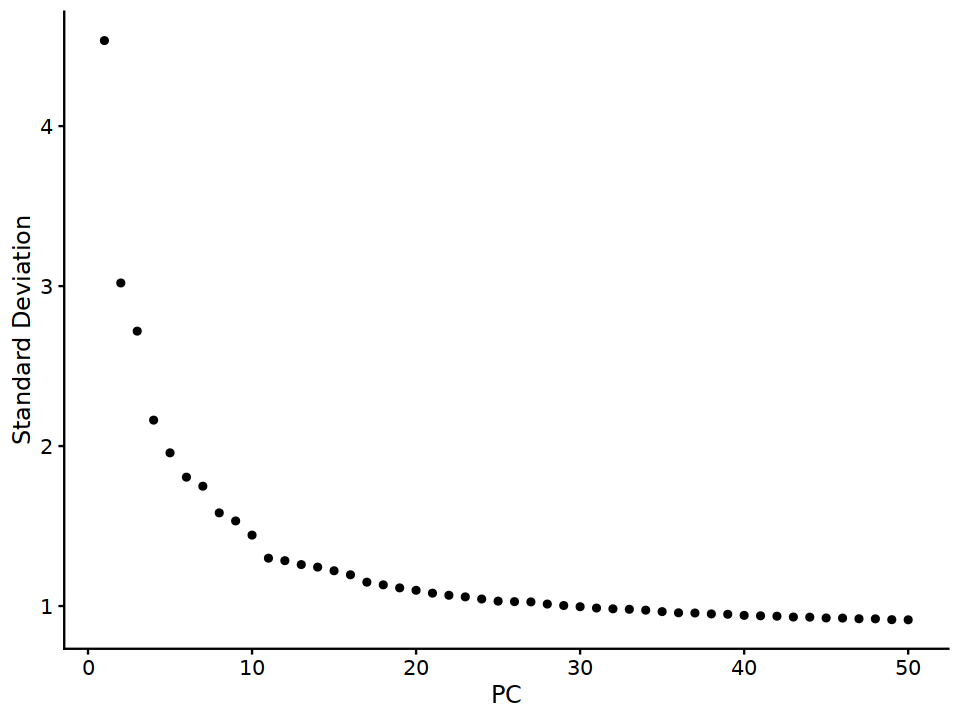

In [60]:
options(repr.plot.width = 8, repr.plot.height = 6)
ElbowPlot(seurat_obj, n=50)

In [61]:
comp=20

Integration with Harmony

In [62]:
# make a copy of the PCA reduction
seurat_obj@reductions$pca_filt <- seurat_obj@reductions$pca

# Filter to the desired number of components according to elbow
seurat_obj@reductions$pca_filt@cell.embeddings <- seurat_obj@reductions$pca_filt@cell.embeddings[, c(1:comp)]
seurat_obj@reductions$pca_filt@feature.loadings <- seurat_obj@reductions$pca_filt@feature.loadings[, c(1:comp)]

In [63]:
seurat_obj <- RunHarmony(
  object = seurat_obj,
  reduction = "pca_filt",
  group.by.vars = "sample_id",
  assay.use = "RNA",
  project.dim = FALSE,
  reduction.save = "harmony"
)

Transposing data matrix

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony converged after 4 iterations



In [64]:
seurat_obj <- RunUMAP(
  seurat_obj,
  dims = 1:comp,
  reduction = "harmony",
  reduction.name = "umap",
  reduction.key = "UMAP_"
)

10:46:46 UMAP embedding parameters a = 0.9922 b = 1.112

10:46:46 Read 22204 rows and found 20 numeric columns

10:46:46 Using Annoy for neighbor search, n_neighbors = 30

10:46:46 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:46:48 Writing NN index file to temp file /scratch_tmp/34329397/RtmpJjA6IZ/file2992c4bf9fb6c

10:46:48 Searching Annoy index using 1 thread, search_k = 3000

10:46:55 Annoy recall = 100%

10:46:56 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

10:46:57 Initializing from normalized Laplacian + noise (using irlba)

10:46:58 Commencing optimization for 200 epochs, with 962832 positive edges

10:47:22 Optimization finished



In [65]:
# Find the K-nearest neighbors
seurat_obj <- FindNeighbors(seurat_obj, reduction = "harmony", dims = 1:comp)
# Find clusters at different resolutions
clusters_df <- cluster_diff_resolutions(
  seurat_obj = seurat_obj,
  min_resolution = 0.1,
  max_resolution = 1.05,
  step = 0.05
)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 22204
Number of edges: 745587

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9510
Number of communities: 6
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 22204
Number of edges: 745587

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9396
Number of communities: 8
Elapsed time: 4 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 22204
Number of edges: 745587

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9318
Number of communities: 8
Elapsed time: 4 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 22204
Number of edges: 745587

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9241
Number of communities: 9
Elapsed time: 4 seconds
Modularity Optim

In [66]:
list_plots <- lapply(unique(clusters_df$resolution), function(x) {
  p <- add_reso_results(seurat_obj, clusters_df, resolution=x)
  umap <- DimPlot(p, reduction = "umap", 
                  group.by=glue::glue("seurat_clusters")) +
    labs(title=glue::glue("Resolution {x}"))
  return(umap)
})

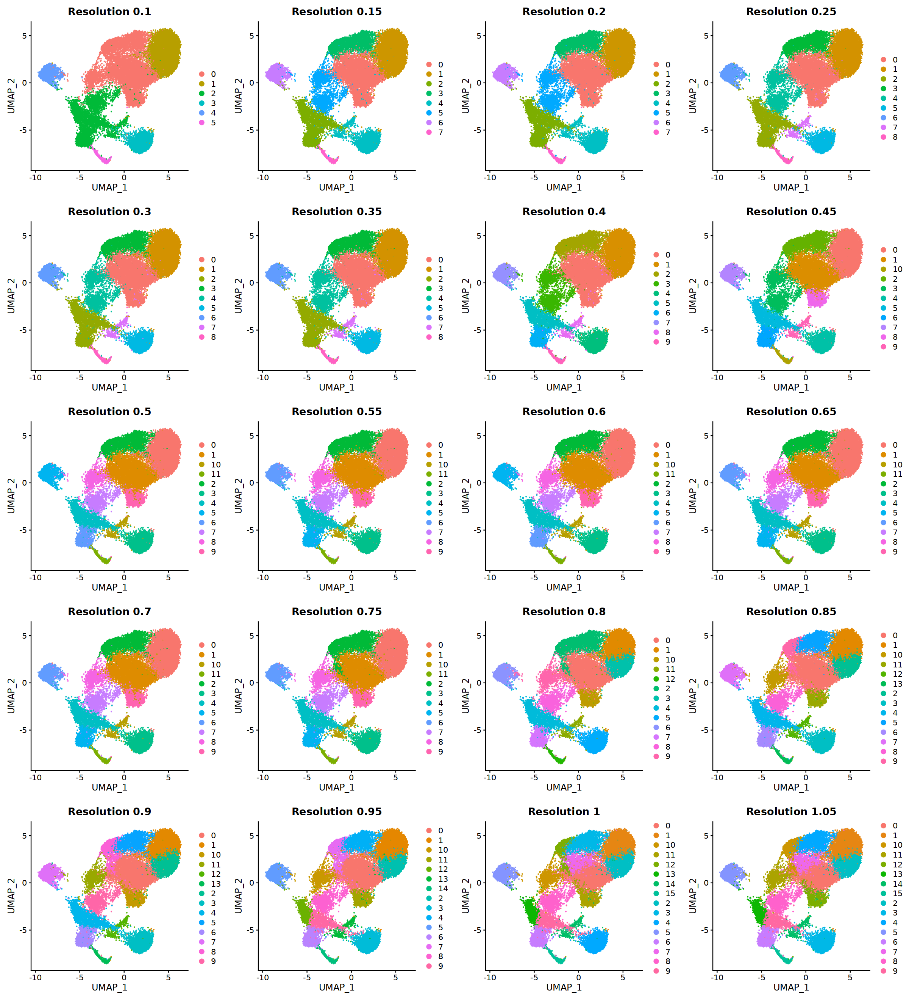

In [67]:
options(repr.plot.width = 20, repr.plot.height = 22, warn=-1,verbose = FALSE)
cp <- cowplot::plot_grid(plotlist = list_plots,
                   align = "hv",
                   axis = "trbl",
                   ncol=4,
                   nrow=5)
cp

In [68]:
reso=1

In [69]:
seurat_obj <- FindClusters(seurat_obj, resolution = reso)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 22204
Number of edges: 745587

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8355
Number of communities: 16
Elapsed time: 4 seconds


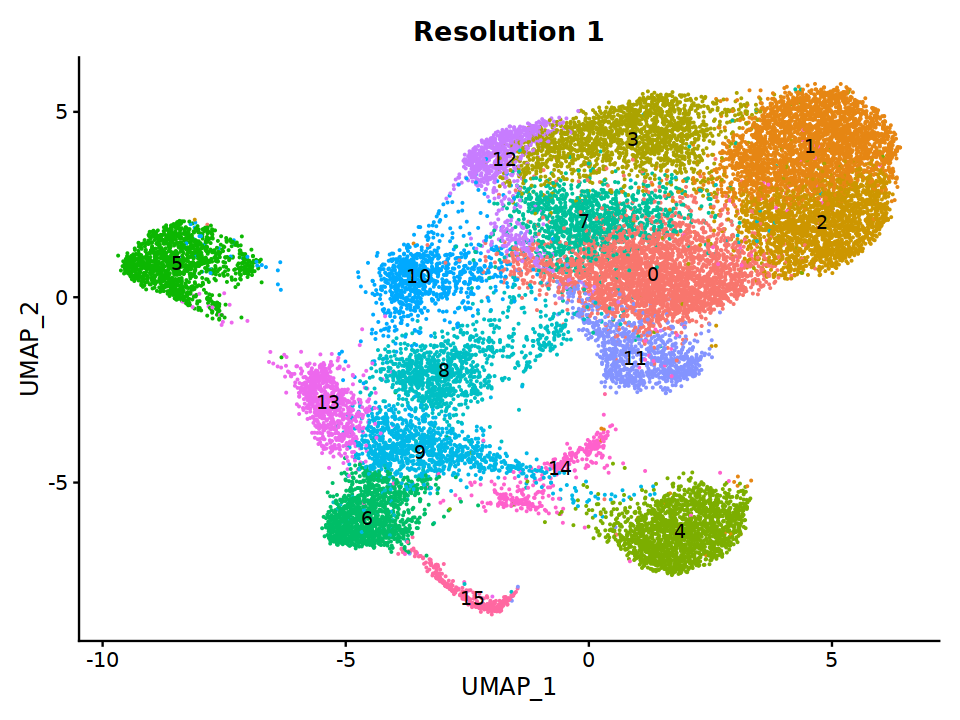

In [70]:
options(repr.plot.width = 8, repr.plot.height = 6, warn=-1,verbose = FALSE)
DimPlot(seurat_obj, reduction = "umap", label = T)+ NoLegend() +
  labs(title=glue("Resolution {reso}")) + theme(plot.title = element_text(hjust = 0.5))

Apply further subclutering to 5 and 14

In [71]:
seurat_obj <- FindSubCluster(
  seurat_obj,
  cluster="5",
  graph.name = "RNA_snn",
  subcluster.name = "subclustering",
  resolution = 0.2,
  algorithm = 1
)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1318
Number of edges: 49978

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8113
Number of communities: 2
Elapsed time: 0 seconds


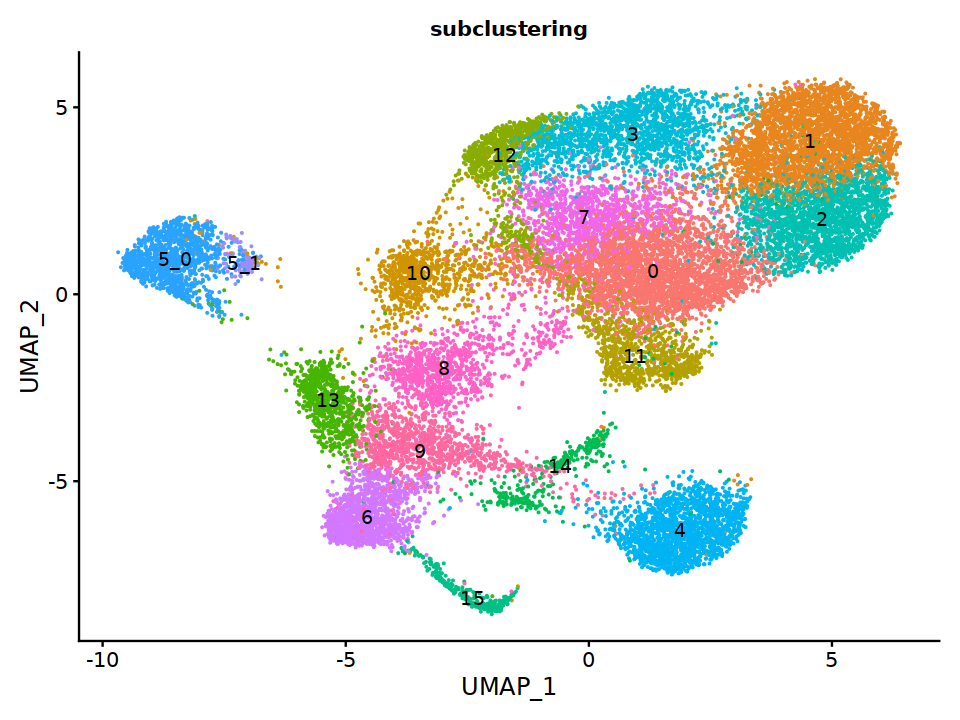

In [72]:
options(repr.plot.width = 8, repr.plot.height = 6, warn=-1,verbose = FALSE)
DimPlot(seurat_obj, reduction = "umap", label = T, group.by="subclustering")+ NoLegend() +
  labs(title=glue("subclustering")) + 
  theme(plot.title = element_text(hjust = 0.5, size = 12, face = "bold"))

In [73]:
seurat_obj <- SetIdent(seurat_obj, value=seurat_obj@meta.data$subclustering)

In [74]:
seurat_obj <- FindSubCluster(
  seurat_obj,
  cluster="14",
  graph.name = "RNA_snn",
  subcluster.name = "subclustering",
  resolution = 0.2,
  algorithm = 1
)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 405
Number of edges: 9702

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8781
Number of communities: 2
Elapsed time: 0 seconds


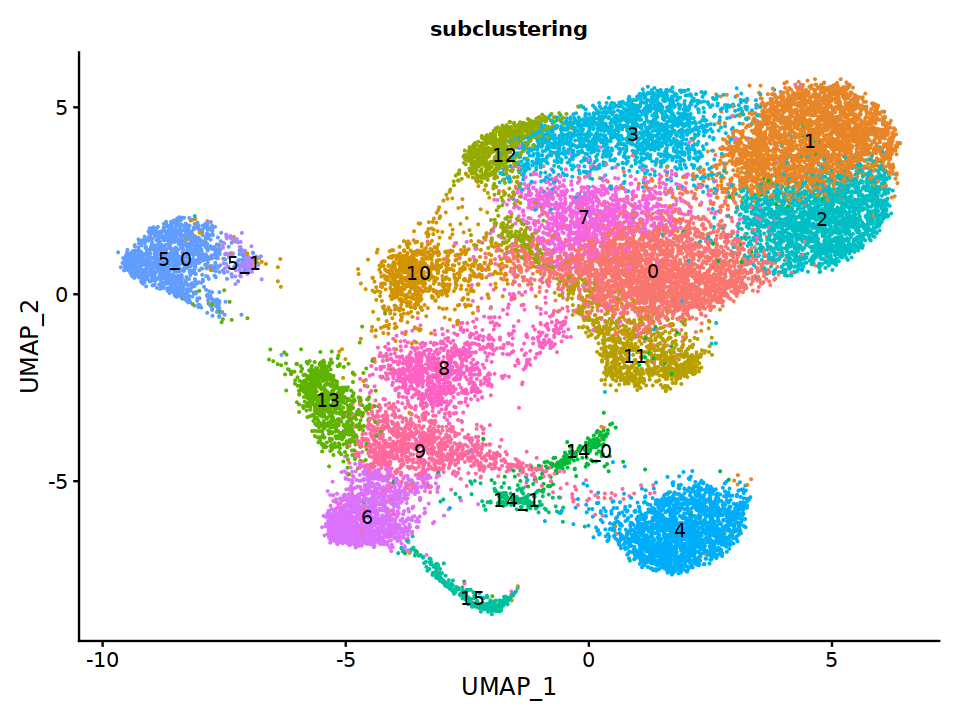

In [75]:
options(repr.plot.width = 8, repr.plot.height = 6, warn=-1,verbose = FALSE)
DimPlot(seurat_obj, reduction = "umap", label = T, group.by="subclustering")+ NoLegend() +
  labs(title=glue("subclustering")) + 
  theme(plot.title = element_text(hjust = 0.5, size = 12, face = "bold"))

In [76]:
seurat_obj <- SetIdent(seurat_obj, value=seurat_obj@meta.data$subclustering)

In [77]:
seurat_obj$tcell_clusters <- Idents(seurat_obj)

In [78]:
rna.markers <- FindAllMarkers(seurat_obj, min.pct=0.1, logfc.threshold=0.1, 
                              random.seed=0, max.cells.per.ident=2000, 
                              only.pos=TRUE)

Calculating cluster 7

Calculating cluster 2

Calculating cluster 1

Calculating cluster 3

Calculating cluster 4

Calculating cluster 0

Calculating cluster 11

Calculating cluster 14_1

Calculating cluster 15

Calculating cluster 10

Calculating cluster 12

Calculating cluster 14_0

Calculating cluster 9

Calculating cluster 8

Calculating cluster 5_0

Calculating cluster 13

Calculating cluster 6

Calculating cluster 5_1



In [79]:
rna.markers <- rna.markers %>% 
  dplyr::filter(p_val_adj < 0.05) %>% 
  arrange(desc(avg_log2FC))

In [80]:
tcell_markers = c("CD3E","CD3D", "CD4", "CD8A","CD8B","ANXA1",
                  "NKG7", "GZMH","GZMB","IFNG","CCL5","PRF1",
                  "ICOS","FOXP3", 
                  "GATA3","RORA","SELL", "LEF1", "TCF7", "CCR7",
                  "FCGR3A",
                  "TRDC", "TRGC1","TRGC2","ZNF683", 
                  "CX3CR1", "ITGAE","CD40LG", "CXCL13",
                  "PDCD1", "HAVCR2", "LAG3", "TOX", "ENTPD1", "IL7R")

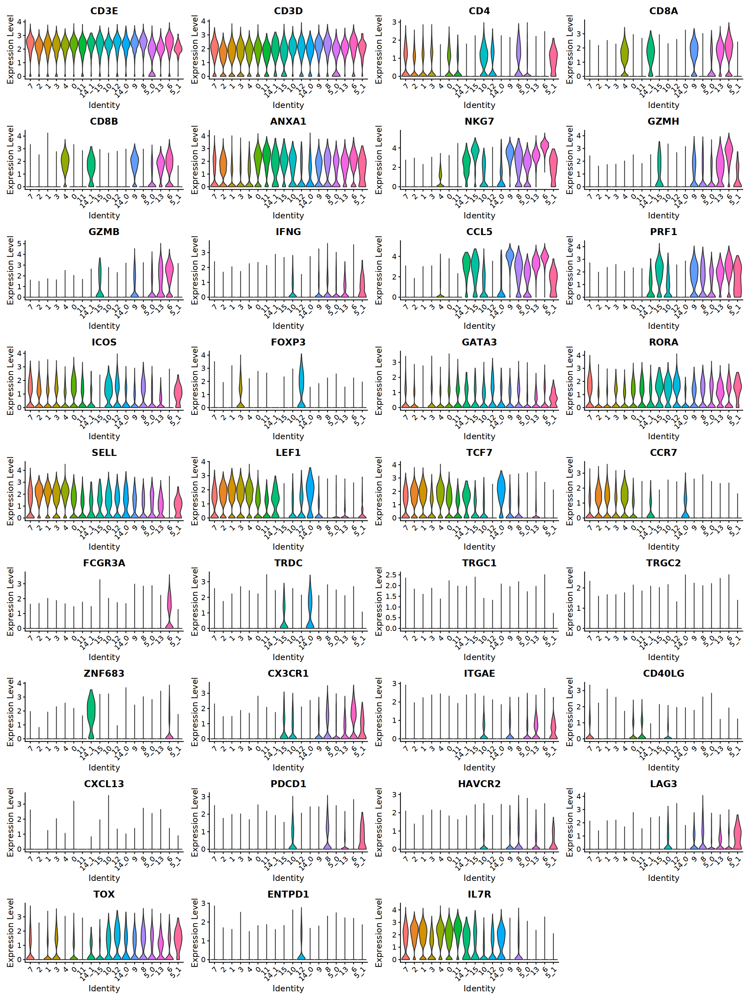

In [81]:
options(repr.plot.width = 18, repr.plot.height = 24, warn=-1,verbose = FALSE)
VlnPlot(seurat_obj,feature=tcell_markers, pt.size=0)

In [82]:
cd8_clusters <- c("4", "5_0", "6", "9", "13", "14_1")
cd4_clusters <- c("0", "1", "2","3","5_1", "7", "8", "10", "12")
others <- c("11", "14_0", "15")

# design according to the color assigments in 4.2-T-cells_Tumor
# saved in utils/style.R as pbmc_pal
custom_pal = c("0"='#41ae76',
              "1"="#9acd32ff",
              "2"="#c2e184",
              "3"="#32cd32ff",
              "4"="#80e5ffff",
              "5_0"="#7bccc4",
              "5_1"="#228B22",
              "6"="#4b51f2",
              "7"='#89a02cff',
              "8"="#aad400ff",
              "9"="#0000FF",
              "10"="#7bcc95",
              "11"="#808080ff",
              "12"="#00FF00",
              "13"="#7ba6cc",
              "14_0"="#c8c4b7ff",
              "14_1"="#87CEFA",
              "15"="#ac9d93ff"
              )

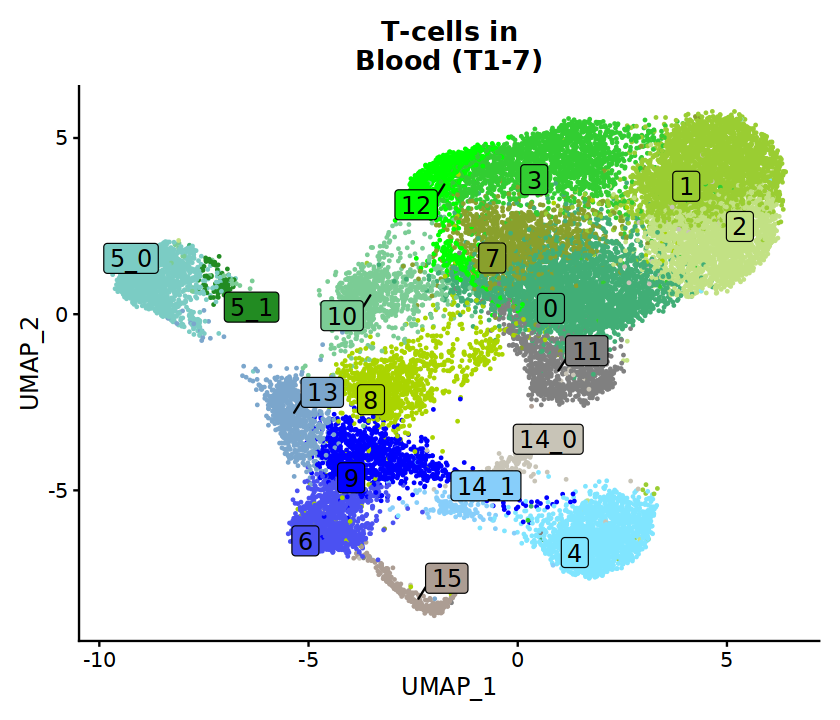

In [83]:
options(repr.plot.width = 7, repr.plot.height = 6, warn=-1,verbose = FALSE)
dpc <- DimPlot(seurat_obj, reduction = "umap", cols=custom_pal,
        label = T,
        label.box = TRUE,
        label.size = 5,
        repel = TRUE,
              pt.size = 0.3) + 
    NoLegend() +
    labs(title=glue("T-cells in\n Blood (T1-7)")) + theme(plot.title = element_text(hjust = 0.5))
dpc

In [84]:
seurat_obj$Tcell_clusters <- Idents(seurat_obj)
seurat_obj$Tcell_clusters <- factor(seurat_obj$Tcell_clusters, levels=c(cd8_clusters, cd4_clusters, others))

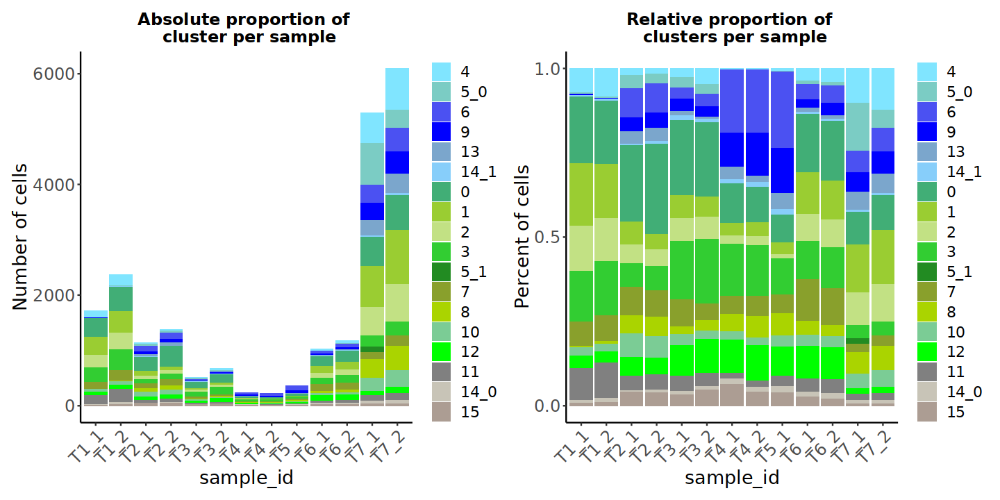

In [85]:
options(repr.plot.width = 12, repr.plot.height = 6, warn=-1,verbose = FALSE)
rel <- dittoBarPlot(seurat_obj, "Tcell_clusters", group.by = "sample_id",
                    color.panel = custom_pal,retain.factor.levels=T) + 
       labs(title = "Relative proportion of \n clusters per sample") +
           theme(plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
                 axis.text.x = element_text(size = 14),  
                 axis.text.y = element_text(size = 14),
                 text = element_text(size = 16),)
abs <- dittoBarPlot(seurat_obj, "Tcell_clusters", group.by = "sample_id", 
             scale = "count", color.panel = custom_pal,retain.factor.levels=T) + 
            labs(title ="Absolute proportion of \n cluster per sample") + 
     theme(plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
           axis.text.x = element_text(size = 14),  
           axis.text.y = element_text(size = 14),
           text = element_text(size = 16),)
abs + rel

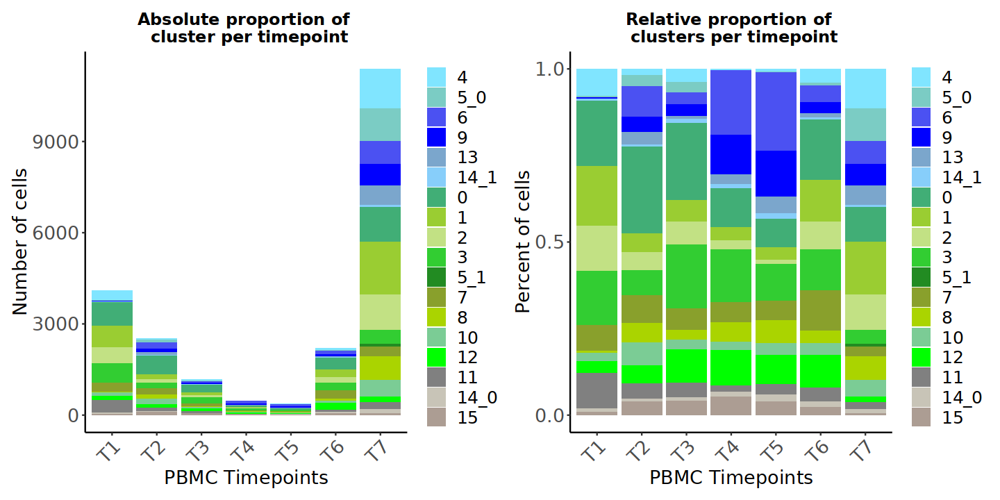

In [86]:
options(repr.plot.width = 12, repr.plot.height = 6, warn=-1,verbose = FALSE)
rel <- dittoBarPlot(seurat_obj, "Tcell_clusters", group.by = "timepoint",
                    color.panel = custom_pal,retain.factor.levels=T) + 
       labs(title = "Relative proportion of \n clusters per timepoint",
            x="PBMC Timepoints",) +
           theme(plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
                 axis.title.y = element_text(size = 16),
                 axis.text.x = element_text(size = 16), 
                 axis.title.x = element_text(size = 16),
                 axis.text.y = element_text(size = 16),
                 text = element_text(size = 18),)
abs <- dittoBarPlot(seurat_obj, "Tcell_clusters", group.by = "timepoint", 
             scale = "count", color.panel = custom_pal,retain.factor.levels=T) + 
            labs(title ="Absolute proportion of \n cluster per timepoint",
                 x="PBMC Timepoints",) + 
     theme(plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
           axis.title.y = element_text(size = 16),
           axis.text.x = element_text(size = 16), 
           axis.title.x = element_text(size = 16),
           axis.text.y = element_text(size = 16),
           text = element_text(size = 18),)
abs + rel

In [87]:
source(here("SCGRES_83_120/misc/paths.R"))
saveRDS(seurat_obj, here(glue("{annot}/{robj_dir}/4.2.2-subset_tcell.rds")))
write.csv(rna.markers, here(glue("{annot}/{robj_dir}/4.2.2-subset_tcell_annot.csv")), row.names=TRUE)

In [88]:
save_plot(plot = dpc, filename=here(glue("{annot}/{plt_dir}/4.2.2-umap_clusters_PBMC.svg")),
          base_width=7, base_height=6)

In [89]:
save_plot(plot = dpc, filename=here(glue("{annot}/{plt_dir}/4.2.2-umap_clusters_PBMC.png")),
          base_width=7, base_height=6)

In [90]:
save_plot(plot = rel, filename=here(glue("{annot}/{plt_dir}/4.2.2-barplot_rel_clusters_PBMC.svg")),
          base_width=7, base_height=6)

In [91]:
source(here("SCGRES_83_120/misc/paths.R"))
seurat_obj <- readRDS(here(glue("{annot}/{robj_dir}/4.2.2-subset_tcell.rds")))

# Session Info

In [92]:
sessionInfo()

R version 4.1.1 (2021-08-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /home/groups/singlecell/isentis/conda_envs/ines_r4.1.1c/lib/libopenblasp-r0.3.24.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=es_ES.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=es_ES.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=es_ES.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=es_ES.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] scran_1.22.1                scater_1.22.0              
 [3] scuttle_1.4.0               SingleCellExperiment_1.16.0
 [5] SummarizedExperiment_1.24.0 Biobase_2.54.0             
 [7] GenomicRanges_1.46.1        GenomeInfoDb_1.30.1        
 [9] IRanges_2.28.0    